In [6]:
# ── Step 1: Imports & Setup ──────────────────────────────────────
import os
import time
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image, UnidentifiedImageError

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix

# ── Reproducibility ──────────────────────────────────────────────
SEED = 7
tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

print("TensorFlow version :", tf.__version__)
print("GPU available      :", tf.config.list_physical_devices('GPU'))
print("TPU available      :", tf.config.list_physical_devices('TPU'))

TensorFlow version : 2.20.0
GPU available      : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TPU available      : []


In [13]:
# ── Step 2: Mount Google Drive ───────────────────────────────────
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
import os

base = "/content/drive/MyDrive/Flower"
for root, dirs, files in os.walk(base):
    level = root.replace(base, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    if level > 2:  # don't go too deep
        break

Flower/
  Flower Classification (1)/
    Train/
      tulip/


In [19]:
# ── Dataset Paths ────────────────────────────────────────────────
from pathlib import Path

dataset_root        = Path("/content/drive/MyDrive/Flower/Flower Classification (1)")
train_dir           = dataset_root / "Train"
test_dir            = dataset_root / "Test"
augmented_train_dir = dataset_root / "Augmented_Train_150"

print("Train dir exists      :", train_dir.exists())
print("Test  dir exists      :", test_dir.exists())

Train dir exists      : True
Test  dir exists      : True


**Global Hyperparameters**

In [20]:
# ── Global Hyperparameters ───────────────────────────────────────
IMG_HEIGHT  = 150
IMG_WIDTH   = 150
BATCH_SIZE  = 32
NUM_CLASSES = 5

print(f"Image Size  : {IMG_HEIGHT} x {IMG_WIDTH}")
print(f"Batch Size  : {BATCH_SIZE}")
print(f"Num Classes : {NUM_CLASSES}")

Image Size  : 150 x 150
Batch Size  : 32
Num Classes : 5


**Count Images Per Class**

In [21]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 4: Count Images Per Class                       ║
# ╚══════════════════════════════════════════════════════════════╝

train_class_counts = {}
train_total = 0

for cls_path in sorted(train_dir.iterdir()):
    if cls_path.is_dir():
        imgs = [f for f in cls_path.glob("*.*")
                if f.suffix.lower() in ['.jpg', '.jpeg', '.png']]
        train_class_counts[cls_path.name] = len(imgs)
        train_total += len(imgs)

test_total = len([f for f in test_dir.iterdir()
                  if f.is_file() and f.suffix.lower() in ['.jpg', '.jpeg', '.png']])

print("=" * 52)
print("     DATASET SUMMARY — Flower Classification")
print("=" * 52)
print(f"  Total Training Images  : {train_total}")
print(f"  Total Test Images      : {test_total}")
print(f"  Grand Total            : {train_total + test_total}")
print(f"  Number of Classes      : {len(train_class_counts)}")
print("=" * 52)
print("\nClass Distribution (Training):")
print("-" * 52)
for cls, cnt in train_class_counts.items():
    pct = cnt / train_total * 100
    bar = "█" * (cnt // 40)
    print(f"  {cls:<12}: {cnt:>4} images ({pct:.1f}%)  {bar}")
print("-" * 52)

     DATASET SUMMARY — Flower Classification
  Total Training Images  : 4312
  Total Test Images      : 5
  Grand Total            : 4317
  Number of Classes      : 5

Class Distribution (Training):
----------------------------------------------------
  daisy       :  763 images (17.7%)  ███████████████████
  dandelion   : 1051 images (24.4%)  ██████████████████████████
  rose        :  783 images (18.2%)  ███████████████████
  sunflower   :  732 images (17.0%)  ██████████████████
  tulip       :  983 images (22.8%)  ████████████████████████
----------------------------------------------------


**Class Distribution Charts (Horizontal Bar + Donut)**

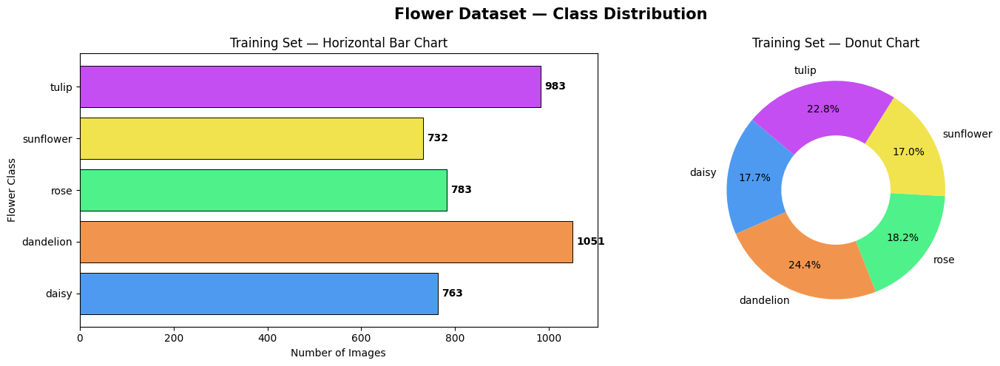

Saved: class_distribution.png


In [22]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 5: Class Distribution Charts                    ║
# ╚══════════════════════════════════════════════════════════════╝

classes = list(train_class_counts.keys())
counts  = list(train_class_counts.values())
colors  = ['#4E9AF1', '#F1954E', '#4EF18A', '#F1E34E', '#C44EF1']

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Flower Dataset — Class Distribution', fontsize=15, fontweight='bold')

# ── Horizontal Bar Chart ─────────────────────────────────────
bars = axes[0].barh(classes, counts, color=colors, edgecolor='black', linewidth=0.7)
axes[0].set_title('Training Set — Horizontal Bar Chart', fontsize=12)
axes[0].set_xlabel('Number of Images')
axes[0].set_ylabel('Flower Class')
for bar, cnt in zip(bars, counts):
    axes[0].text(bar.get_width() + 8, bar.get_y() + bar.get_height() / 2,
                 str(cnt), va='center', fontsize=10, fontweight='bold')

# ── Donut Chart ──────────────────────────────────────────────
axes[1].pie(counts, labels=classes, colors=colors, autopct='%1.1f%%',
            startangle=140, pctdistance=0.75,
            wedgeprops=dict(width=0.5))   # <-- makes it a donut
axes[1].set_title('Training Set — Donut Chart', fontsize=12)

plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: class_distribution.png")

**Sample Images (3 per class)**

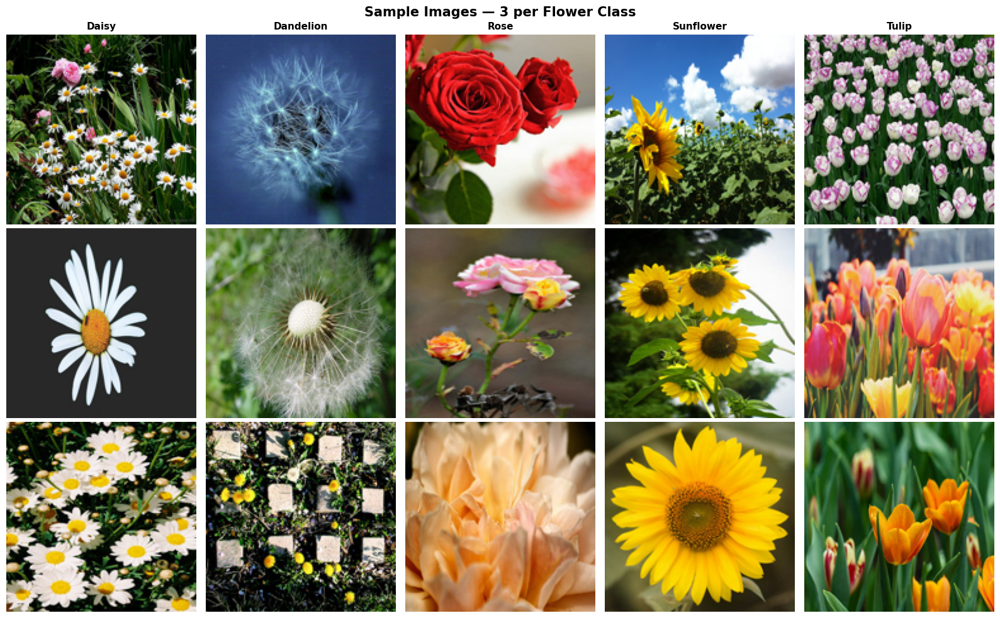

Saved: sample_images.png


In [23]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 6: Sample Images (3 per Class)                  ║
# ╚══════════════════════════════════════════════════════════════╝

fig, axes = plt.subplots(3, NUM_CLASSES, figsize=(16, 10))
fig.suptitle('Sample Images — 3 per Flower Class', fontsize=15, fontweight='bold')

for col, cls_name in enumerate(sorted(train_class_counts.keys())):
    cls_path  = train_dir / cls_name
    img_files = [f for f in cls_path.glob("*.*")
                 if f.suffix.lower() in ['.jpg', '.jpeg', '.png']]
    chosen = random.sample(img_files, 3)

    for row in range(3):
        img = Image.open(chosen[row]).resize((IMG_WIDTH, IMG_HEIGHT))
        axes[row, col].imshow(img)
        if row == 0:
            axes[row, col].set_title(cls_name.capitalize(),
                                     fontsize=11, fontweight='bold')
        axes[row, col].axis('off')

plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: sample_images.png")

**Image Size Distribution**

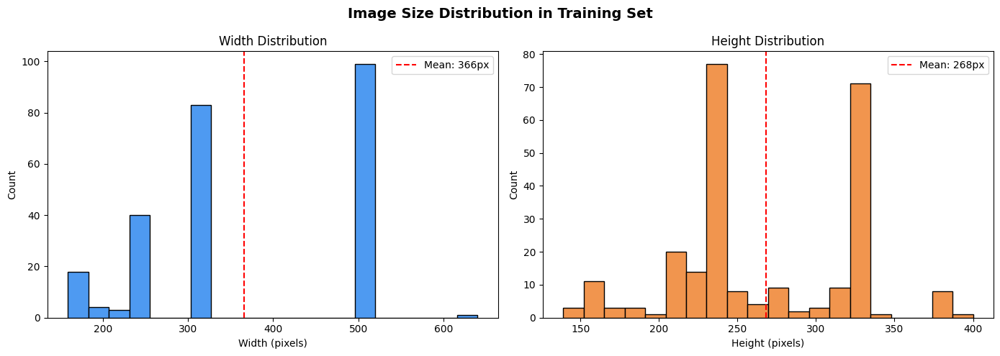

Average Width : 366.0px
Average Height: 268.3px
Saved: image_size_distribution.png


In [24]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 7: Image Size Distribution (Extra)              ║
# ╚══════════════════════════════════════════════════════════════╝

widths, heights = [], []

for cls_path in sorted(train_dir.iterdir()):
    if not cls_path.is_dir():
        continue
    for img_path in list(cls_path.glob("*.*"))[:50]:  # sample 50 per class
        if img_path.suffix.lower() in ['.jpg', '.jpeg', '.png']:
            try:
                with Image.open(img_path) as img:
                    w, h = img.size
                    widths.append(w)
                    heights.append(h)
            except Exception:
                pass

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Image Size Distribution in Training Set', fontsize=14, fontweight='bold')

axes[0].hist(widths, bins=20, color='#4E9AF1', edgecolor='black')
axes[0].set_title('Width Distribution')
axes[0].set_xlabel('Width (pixels)')
axes[0].set_ylabel('Count')
axes[0].axvline(np.mean(widths), color='red', linestyle='--',
                label=f'Mean: {np.mean(widths):.0f}px')
axes[0].legend()

axes[1].hist(heights, bins=20, color='#F1954E', edgecolor='black')
axes[1].set_title('Height Distribution')
axes[1].set_xlabel('Height (pixels)')
axes[1].set_ylabel('Count')
axes[1].axvline(np.mean(heights), color='red', linestyle='--',
                label=f'Mean: {np.mean(heights):.0f}px')
axes[1].legend()

plt.tight_layout()
plt.savefig('image_size_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Average Width : {np.mean(widths):.1f}px")
print(f"Average Height: {np.mean(heights):.1f}px")
print("Saved: image_size_distribution.png")

**Scan & Remove Corrupted Images**

In [25]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 8: Scan & Remove Corrupted Images               ║
# ╚══════════════════════════════════════════════════════════════╝

print("Scanning for corrupted images...\n")
corrupted  = []
total_scanned = 0

for cls_path in sorted(train_dir.iterdir()):
    if not cls_path.is_dir():
        continue
    cls_bad = 0
    for img_path in cls_path.glob("*.*"):
        if img_path.suffix.lower() not in ['.jpg', '.jpeg', '.png']:
            continue
        total_scanned += 1
        try:
            img = Image.open(img_path)
            img.verify()
        except Exception:
            corrupted.append(img_path)
            cls_bad += 1
    print(f"  {cls_path.name:<12}: scanned | {cls_bad} corrupted")

print(f"\nTotal scanned  : {total_scanned}")
print(f"Total corrupted: {len(corrupted)}")

if corrupted:
    print("\nRemoving corrupted files...")
    for f in corrupted:
        f.unlink()
        print(f"  Deleted: {f.name}")
else:
    print("\nNo corrupted images found. Dataset is clean ✓")

Scanning for corrupted images...

  daisy       : scanned | 7 corrupted
  dandelion   : scanned | 7 corrupted
  rose        : scanned | 7 corrupted
  sunflower   : scanned | 7 corrupted
  tulip       : scanned | 7 corrupted

Total scanned  : 4312
Total corrupted: 35

Removing corrupted files...
  Deleted: 2908212142_5437fa67ff_n.jpg
  Deleted: 2536529152_33ef3ee078_n.jpg
  Deleted: 3475870145_685a19116d.jpg
  Deleted: 34532930772_5cc5fc600d_n.jpg
  Deleted: 33880234094_2541c9c83d_n.jpg
  Deleted: 33884228533_91b75ff4d4_n.jpg
  Deleted: 4563059851_45a9d21a75.jpg
  Deleted: 17075803866_aeeded2637.jpg
  Deleted: 10919961_0af657c4e8.jpg
  Deleted: 34729107795_c746845e17_n.jpg
  Deleted: 34323645656_afd53a9996_n.jpg
  Deleted: 2995221296_a6ddaccc39.jpg
  Deleted: 468749497_951c571eff_n.jpg
  Deleted: 7015947703_11b30c20c9_n.jpg
  Deleted: 16001846141_393fdb887e_n.jpg
  Deleted: 4279990882_031482f8b6_n.jpg
  Deleted: 3407482427_49d5c75291_m.jpg
  Deleted: 18490508225_0fc630e963_n.jpg
  Delet

**Augment & Balance Classes**

In [26]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 9: Augment & Balance Classes to 1200 Each       ║
# ╚══════════════════════════════════════════════════════════════╝

import shutil

TARGET_PER_CLASS = 1200

aug_datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.25,
    height_shift_range=0.25,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# ── Check if augmentation already done ───────────────────────
already_done = False
if augmented_train_dir.exists():
    counts_check = {}
    for cls_path in augmented_train_dir.iterdir():
        if cls_path.is_dir():
            n = len([f for f in cls_path.glob("*.*")
                     if f.suffix.lower() in ['.jpg', '.jpeg', '.png']])
            counts_check[cls_path.name] = n
    if len(counts_check) == NUM_CLASSES and all(v >= TARGET_PER_CLASS for v in counts_check.values()):
        already_done = True
        print("Augmented dataset already exists. Skipping generation.")
        for cls, cnt in counts_check.items():
            print(f"  {cls:<12}: {cnt} images")

# ── Run Augmentation ─────────────────────────────────────────
if not already_done:
    if augmented_train_dir.exists():
        shutil.rmtree(augmented_train_dir)
    augmented_train_dir.mkdir(parents=True)
    print("Starting augmentation...\n")

    for cls_name, original_count in train_class_counts.items():
        cls_src  = train_dir / cls_name
        cls_dest = augmented_train_dir / cls_name
        cls_dest.mkdir()

        orig_imgs = [f for f in cls_src.glob("*.*")
                     if f.suffix.lower() in ['.jpg', '.jpeg', '.png']]

        # Copy original images first
        for img_path in orig_imgs:
            shutil.copy(img_path, cls_dest / img_path.name)

        # Generate augmented images to reach target
        needed = TARGET_PER_CLASS - original_count
        for i in range(needed):
            src = random.choice(orig_imgs)
            img = keras.utils.load_img(src, target_size=(IMG_HEIGHT, IMG_WIDTH))
            x   = keras.utils.img_to_array(img).astype('float32')
            x_aug = aug_datagen.random_transform(x)
            aug_img = Image.fromarray(np.clip(x_aug, 0, 255).astype('uint8'))
            aug_img.save(cls_dest / f"aug_{cls_name}_{i:04d}.jpeg")

        print(f"  {cls_name:<12}: {original_count} original + {needed} augmented = {TARGET_PER_CLASS} total")

    print("\nAugmentation complete! ✓")

Starting augmentation...

  daisy       : 763 original + 437 augmented = 1200 total
  dandelion   : 1051 original + 149 augmented = 1200 total
  rose        : 783 original + 417 augmented = 1200 total
  sunflower   : 732 original + 468 augmented = 1200 total
  tulip       : 983 original + 217 augmented = 1200 total

Augmentation complete! ✓


**Visualise Original vs Augmented**

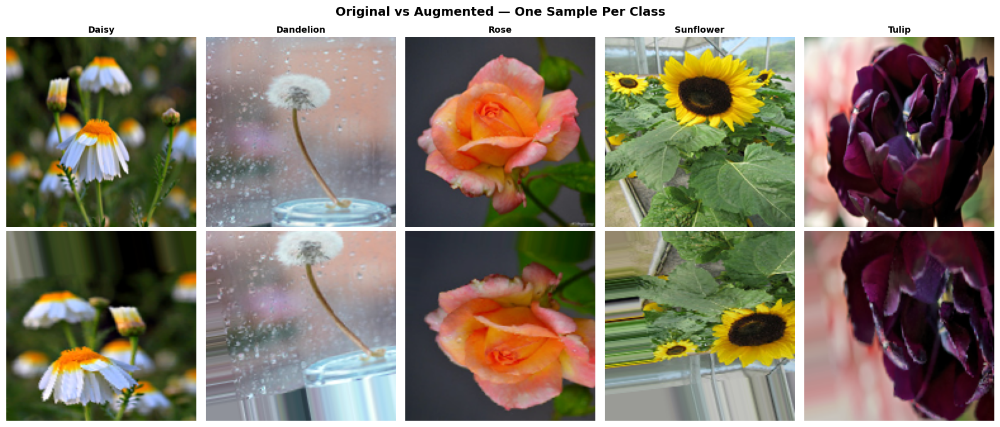

Saved: augmentation_comparison.png


In [27]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 10: Visualise Original vs Augmented             ║
# ╚══════════════════════════════════════════════════════════════╝

aug_preview = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.25,
    height_shift_range=0.25,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

fig, axes = plt.subplots(2, NUM_CLASSES, figsize=(16, 7))
fig.suptitle('Original vs Augmented — One Sample Per Class',
             fontsize=14, fontweight='bold')

for col, cls_name in enumerate(sorted(train_class_counts.keys())):
    cls_path  = train_dir / cls_name
    img_files = [f for f in cls_path.glob("*.*")
                 if f.suffix.lower() in ['.jpg', '.jpeg', '.png']]
    chosen = random.choice(img_files)

    # Original
    orig = Image.open(chosen).resize((IMG_HEIGHT, IMG_WIDTH))
    axes[0, col].imshow(orig)
    axes[0, col].set_title(cls_name.capitalize(), fontsize=10, fontweight='bold')
    axes[0, col].set_ylabel('Original' if col == 0 else '', fontsize=9)
    axes[0, col].axis('off')

    # Augmented
    x = keras.utils.img_to_array(
            keras.utils.load_img(chosen, target_size=(IMG_HEIGHT, IMG_WIDTH))
        ).astype('float32')
    x_aug = aug_preview.random_transform(x)
    axes[1, col].imshow(np.clip(x_aug, 0, 255).astype('uint8'))
    axes[1, col].set_ylabel('Augmented' if col == 0 else '', fontsize=9)
    axes[1, col].axis('off')

plt.tight_layout()
plt.savefig('augmentation_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: augmentation_comparison.png")

**Create Train & Validation Generators**

In [28]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 11: Train & Validation Generators               ║
# ╚══════════════════════════════════════════════════════════════╝

main_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_gen = main_datagen.flow_from_directory(
    augmented_train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    subset='training',
    seed=SEED,
    shuffle=True
)

val_gen = main_datagen.flow_from_directory(
    augmented_train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    subset='validation',
    seed=SEED,
    shuffle=False
)

class_names = list(train_gen.class_indices.keys())
print("Classes           :", class_names)
print(f"Training samples  : {train_gen.samples}")
print(f"Validation samples: {val_gen.samples}")
print(f"Training batches  : {len(train_gen)}")
print(f"Validation batches: {len(val_gen)}")

Found 4775 images belonging to 5 classes.
Found 1190 images belonging to 5 classes.
Classes           : ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Training samples  : 4775
Validation samples: 1190
Training batches  : 150
Validation batches: 38


**Build Baseline CNN**

In [29]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 12: Build Baseline CNN Model                    ║
# ╚══════════════════════════════════════════════════════════════╝

baseline_model = keras.Sequential([
    keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3)),

    # ── Conv Block 1: 64 filters ─────────────────────────────
    layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),

    # ── Conv Block 2: 128 filters ────────────────────────────
    layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),

    # ── Conv Block 3: 256 filters ────────────────────────────
    layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),

    # ── Flatten ──────────────────────────────────────────────
    layers.Flatten(),

    # ── FCN Layer 1 ──────────────────────────────────────────
    layers.Dense(512, activation='relu'),

    # ── FCN Layer 2 ──────────────────────────────────────────
    layers.Dense(256, activation='relu'),

    # ── FCN Layer 3 ──────────────────────────────────────────
    layers.Dense(128, activation='relu'),

    # ── Output Layer ─────────────────────────────────────────
    layers.Dense(NUM_CLASSES, activation='softmax')

], name="Baseline_CNN")

baseline_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

baseline_model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 82944)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    42,467,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,003,525 (164.05 MB)

 Trainable params: 43,003,525 (164.05 MB)

 Non-trainable params: 0 (0.00 B)

**Train Baseline Model**

In [30]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 13: Train Baseline CNN Model                    ║
# ╚══════════════════════════════════════════════════════════════╝

callbacks_baseline = [
    EarlyStopping(
        monitor='val_loss',
        patience=7,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6,
        verbose=1
    )
]

print("Training Baseline CNN...\n")
start_baseline = time.time()

history_baseline = baseline_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=callbacks_baseline,
    verbose=1
)

baseline_time = time.time() - start_baseline
print(f"\nBaseline training complete in {baseline_time / 60:.2f} minutes.")

Training Baseline CNN...

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 45s 192ms/step - accuracy: 0.4170 - loss: 1.3239 - val_accuracy: 0.5261 - val_loss: 1.0899 - learning_rate: 0.0010
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - accuracy: 0.5380 - loss: 1.0969 - val_accuracy: 0.5916 - val_loss: 0.9752 - learning_rate: 0.0010
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - accuracy: 0.6186 - loss: 0.9569 - val_accuracy: 0.6092 - val_loss: 0.9294 - learning_rate: 0.0010
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - accuracy: 0.6838 - loss: 0.7959 - val_accuracy: 0.6445 - val_loss: 0.9737 - learning_rate: 0.0010
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 21s 137ms/step - accuracy: 0.7692 - loss: 0.6031 - val_accuracy: 0.6555 - val_loss: 0.9730 - learning_rate: 0.0010
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 0.8595 - loss: 0.3817
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 13

**Plot Training Curves**

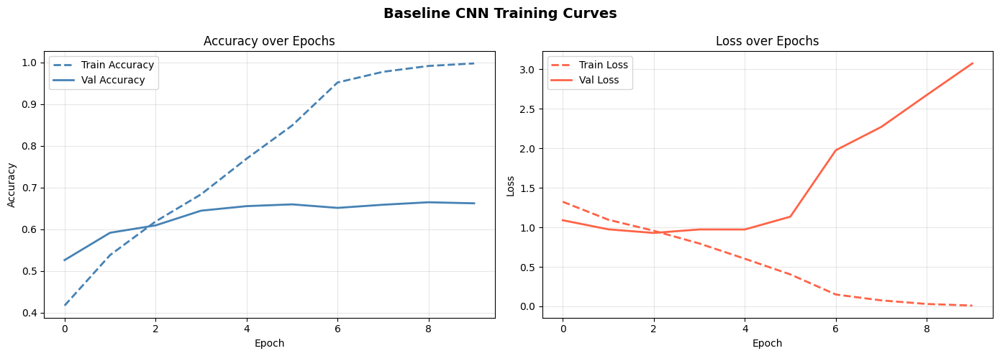

Saved: baseline_cnn_training_curves.png


In [31]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 14: Plot Baseline Training Curves               ║
# ╚══════════════════════════════════════════════════════════════╝

def plot_history(history, title, acc_color='steelblue', loss_color='tomato'):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(title, fontsize=14, fontweight='bold')

    # ── Accuracy ─────────────────────────────────────────────
    axes[0].plot(history.history['accuracy'],
                 label='Train Accuracy', color=acc_color,
                 linestyle='--', linewidth=2)
    axes[0].plot(history.history['val_accuracy'],
                 label='Val Accuracy', color=acc_color, linewidth=2)
    axes[0].set_title("Accuracy over Epochs")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Accuracy")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # ── Loss ─────────────────────────────────────────────────
    axes[1].plot(history.history['loss'],
                 label='Train Loss', color=loss_color,
                 linestyle='--', linewidth=2)
    axes[1].plot(history.history['val_loss'],
                 label='Val Loss', color=loss_color, linewidth=2)
    axes[1].set_title("Loss over Epochs")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Loss")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    fname = title.lower().replace(" ", "_") + ".png"
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Saved: {fname}")

plot_history(history_baseline, "Baseline CNN Training Curves")

**Evaluate Baseline Model**

In [32]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 15: Evaluate Baseline CNN                       ║
# ╚══════════════════════════════════════════════════════════════╝

val_loss_b, val_acc_b = baseline_model.evaluate(val_gen, verbose=0)

print("=" * 55)
print("        BASELINE CNN — EVALUATION REPORT")
print("=" * 55)
print(f"  Validation Accuracy : {val_acc_b * 100:.2f}%")
print(f"  Validation Loss     : {val_loss_b:.4f}")
print(f"  Training Time       : {baseline_time / 60:.2f} min")
print("=" * 55)

# ── Classification Report ─────────────────────────────────────
val_gen.reset()
y_pred_b = np.argmax(baseline_model.predict(val_gen, verbose=0), axis=1)
y_true_b = val_gen.classes

print("\nClassification Report:")
print(classification_report(y_true_b, y_pred_b, target_names=class_names))

        BASELINE CNN — EVALUATION REPORT
  Validation Accuracy : 60.92%
  Validation Loss     : 0.9294
  Training Time       : 3.82 min

Classification Report:
              precision    recall  f1-score   support

       daisy       0.73      0.65      0.69       238
   dandelion       0.64      0.63      0.63       238
        rose       0.64      0.32      0.43       238
   sunflower       0.59      0.90      0.71       238
       tulip       0.50      0.54      0.52       238

    accuracy                           0.61      1190
   macro avg       0.62      0.61      0.60      1190
weighted avg       0.62      0.61      0.60      1190



**Confusion Matrix**

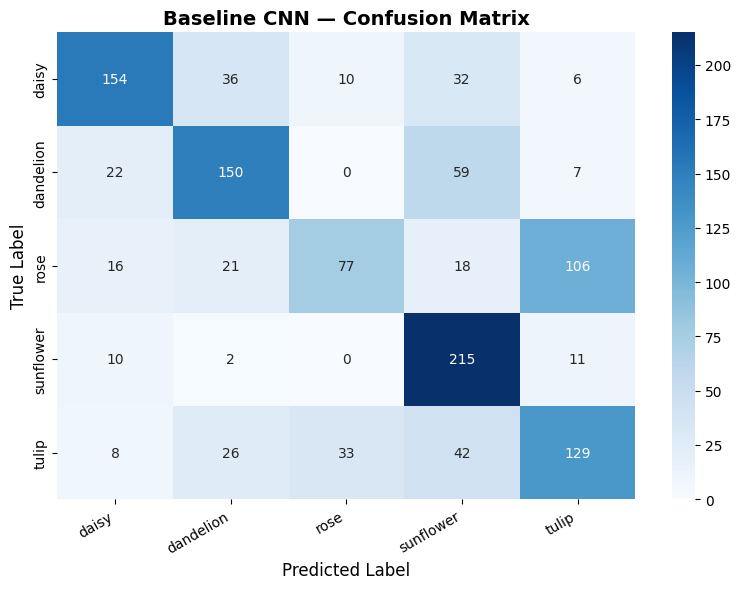

Saved: baseline_confusion_matrix.png


In [33]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 16: Baseline CNN — Confusion Matrix             ║
# ╚══════════════════════════════════════════════════════════════╝

cm_b = confusion_matrix(y_true_b, y_pred_b)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_b, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('Baseline CNN — Confusion Matrix', fontsize=14, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.savefig('baseline_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: baseline_confusion_matrix.png")

**Per-Class Accuracy Bar Chart**

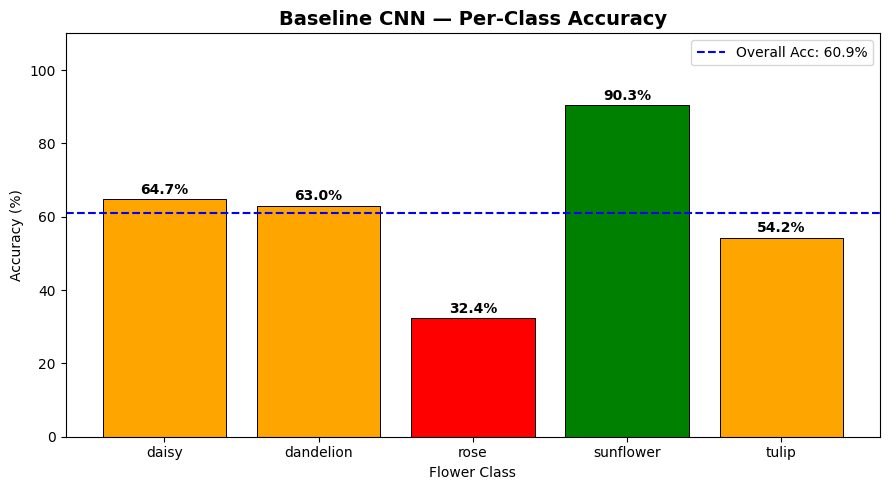

Saved: baseline_per_class_accuracy.png


In [34]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 17: Per-Class Accuracy (Extra Visualization)    ║
# ╚══════════════════════════════════════════════════════════════╝

per_class_acc = cm_b.diagonal() / cm_b.sum(axis=1)
colors_acc = ['green' if a >= 0.7 else 'orange' if a >= 0.5 else 'red'
              for a in per_class_acc]

plt.figure(figsize=(9, 5))
bars = plt.bar(class_names, per_class_acc * 100, color=colors_acc,
               edgecolor='black', linewidth=0.7)
plt.title('Baseline CNN — Per-Class Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Flower Class')
plt.ylabel('Accuracy (%)')
plt.ylim(0, 110)
for bar, acc in zip(bars, per_class_acc):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1.5,
             f"{acc * 100:.1f}%", ha='center', fontsize=10, fontweight='bold')
plt.axhline(y=val_acc_b * 100, color='blue', linestyle='--',
            linewidth=1.5, label=f'Overall Acc: {val_acc_b*100:.1f}%')
plt.legend()
plt.tight_layout()
plt.savefig('baseline_per_class_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: baseline_per_class_accuracy.png")

**Sample Predictions**

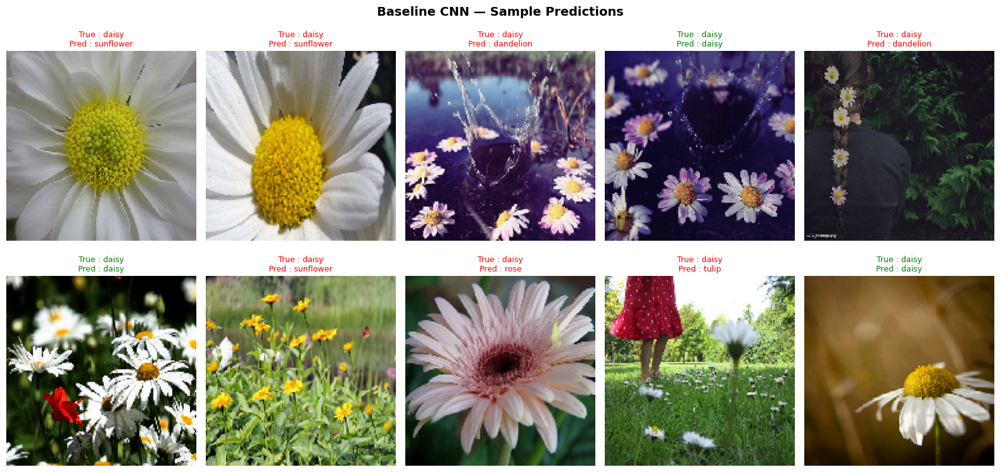

Saved: baseline_predictions.png


In [35]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 18: Baseline CNN — Sample Predictions           ║
# ╚══════════════════════════════════════════════════════════════╝

val_gen.reset()
images, labels = next(val_gen)

fig, axes = plt.subplots(2, 5, figsize=(16, 8))
fig.suptitle('Baseline CNN — Sample Predictions', fontsize=14, fontweight='bold')

for i, ax in enumerate(axes.flat):
    img  = images[i]
    true = class_names[int(labels[i])]
    pred = class_names[np.argmax(
               baseline_model.predict(img[np.newaxis, ...], verbose=0))]
    color = 'green' if true == pred else 'red'
    ax.imshow(img)
    ax.set_title(f"True : {true}\nPred : {pred}",
                 color=color, fontsize=9, pad=5)
    ax.axis('off')

plt.tight_layout()
plt.savefig('baseline_predictions.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: baseline_predictions.png")

**Build Deeper CNN**

In [36]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 19: Build Deeper CNN with Regularization        ║
# ╚══════════════════════════════════════════════════════════════╝

def build_deeper_model():
    model = keras.Sequential([
        keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3)),

        # ── Conv Block 1: 64 filters (x2) ────────────────────
        layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.AveragePooling2D((2, 2)),

        # ── Conv Block 2: 128 filters (x2) ───────────────────
        layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.AveragePooling2D((2, 2)),

        # ── Conv Block 3: 256 filters (x2) ───────────────────
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.AveragePooling2D((2, 2)),

        # ── Flatten ───────────────────────────────────────────
        layers.Flatten(),

        # ── FCN 1: 512 units + BN + Dropout + L2 ─────────────
        layers.Dense(512, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.5),

        # ── FCN 2: 256 units + BN + Dropout + L2 ─────────────
        layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # ── Output Layer ──────────────────────────────────────
        layers.Dense(NUM_CLASSES, activation='softmax')

    ], name="Deeper_CNN_BN_Dropout_L2")

    return model

deeper_model = build_deeper_model()

deeper_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

deeper_model.summary()

Model: "Deeper_CNN_BN_Dropout_L2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 150, 150, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d               │ (None, 75, 75, 64)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 75, 75, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 75, 75, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_1             │ (None, 37, 37, 128)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 37, 37, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 37, 37, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_2             │ (None, 18, 18, 256)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 82944)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │    42,467,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │       131,32

 Total params: 43,752,517 (166.90 MB)

 Trainable params: 43,749,189 (166.89 MB)

 Non-trainable params: 3,328 (13.00 KB)

**Compare Parameter Count**

In [37]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 20: Compare Parameter Count                     ║
# ╚══════════════════════════════════════════════════════════════╝

baseline_params = baseline_model.count_params()
deeper_params   = deeper_model.count_params()

print("=" * 45)
print("       MODEL PARAMETER COMPARISON")
print("=" * 45)
print(f"  Baseline CNN params : {baseline_params:>10,}")
print(f"  Deeper   CNN params : {deeper_params:>10,}")
print(f"  Ratio               : {deeper_params / baseline_params:.2f}x larger")
print("=" * 45)

       MODEL PARAMETER COMPARISON
  Baseline CNN params : 43,003,525
  Deeper   CNN params : 43,752,517
  Ratio               : 1.02x larger


**Train Deeper Model**

In [38]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 21: Train Deeper CNN Model                      ║
# ╚══════════════════════════════════════════════════════════════╝

callbacks_deeper = [
    EarlyStopping(
        monitor='val_loss',
        patience=7,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    )
]

print("Training Deeper CNN...\n")
start_deeper = time.time()

history_deeper = deeper_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=callbacks_deeper,
    verbose=1
)

deeper_time = time.time() - start_deeper
print(f"\nDeeper model training complete in {deeper_time / 60:.2f} minutes.")

Training Deeper CNN...

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - accuracy: 0.4314 - loss: 4.7672 - val_accuracy: 0.2176 - val_loss: 5.9039 - learning_rate: 0.0010
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - accuracy: 0.4817 - loss: 3.7711 - val_accuracy: 0.2571 - val_loss: 4.1473 - learning_rate: 0.0010
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - accuracy: 0.5290 - loss: 2.9027 - val_accuracy: 0.4966 - val_loss: 2.6998 - learning_rate: 0.0010
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - accuracy: 0.5659 - loss: 2.4619 - val_accuracy: 0.5958 - val_loss: 2.2701 - learning_rate: 0.0010
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - accuracy: 0.5778 - loss: 2.2036 - val_accuracy: 0.6538 - val_loss: 2.0192 - learning_rate: 0.0010
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - accuracy: 0.5973 - loss: 2.0614 - val_accuracy: 0.4420 - val_loss: 2.4137 - learning_rate: 0.0010
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 13

**Plot Deeper Model Training Curves**

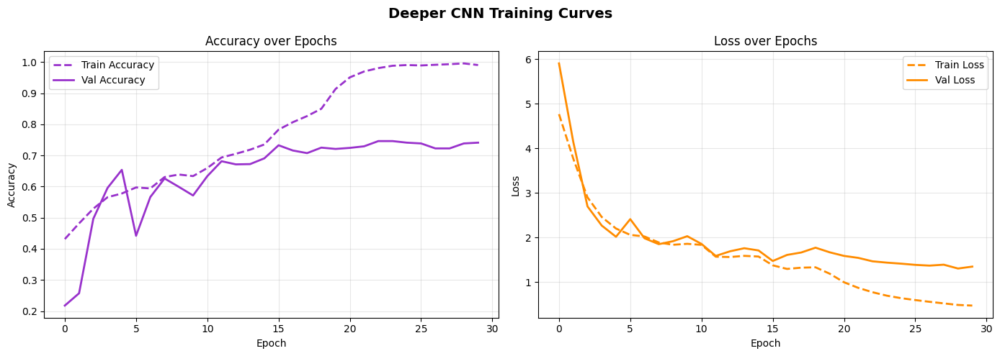

Saved: deeper_cnn_training_curves.png


In [39]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 22: Plot Deeper CNN Training Curves             ║
# ╚══════════════════════════════════════════════════════════════╝

plot_history(history_deeper,
             "Deeper CNN Training Curves",
             acc_color='darkorchid',
             loss_color='darkorange')

**Evaluate Deeper Model**

In [40]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 23: Evaluate Deeper CNN                         ║
# ╚══════════════════════════════════════════════════════════════╝

val_loss_d, val_acc_d = deeper_model.evaluate(val_gen, verbose=0)

print("=" * 55)
print("        DEEPER CNN — EVALUATION REPORT")
print("=" * 55)
print(f"  Validation Accuracy : {val_acc_d * 100:.2f}%")
print(f"  Validation Loss     : {val_loss_d:.4f}")
print(f"  Training Time       : {deeper_time / 60:.2f} min")
print("=" * 55)

val_gen.reset()
y_pred_d = np.argmax(deeper_model.predict(val_gen, verbose=0), axis=1)
y_true_d = val_gen.classes

print("\nClassification Report:")
print(classification_report(y_true_d, y_pred_d, target_names=class_names))

        DEEPER CNN — EVALUATION REPORT
  Validation Accuracy : 73.87%
  Validation Loss     : 1.3078
  Training Time       : 10.18 min

Classification Report:
              precision    recall  f1-score   support

       daisy       0.87      0.73      0.79       238
   dandelion       0.73      0.81      0.77       238
        rose       0.64      0.64      0.64       238
   sunflower       0.76      0.86      0.80       238
       tulip       0.71      0.66      0.68       238

    accuracy                           0.74      1190
   macro avg       0.74      0.74      0.74      1190
weighted avg       0.74      0.74      0.74      1190



**Confusion Matrix Deeper Model**

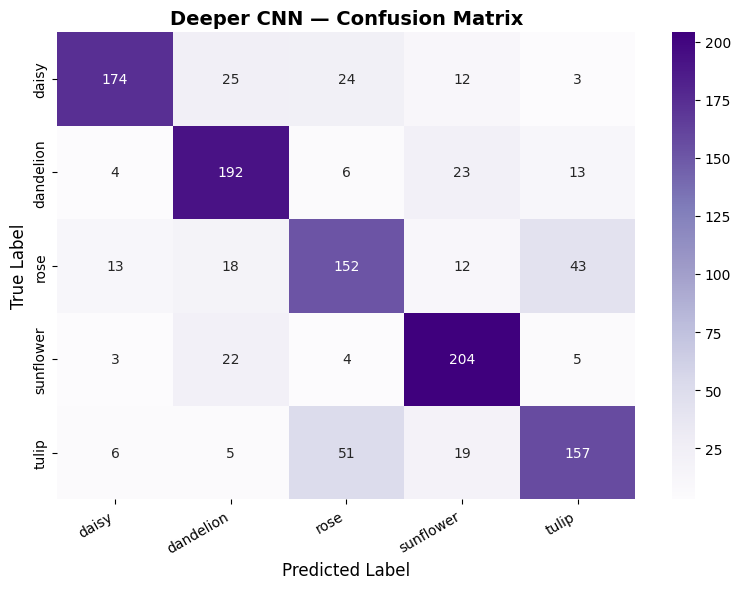

Saved: deeper_confusion_matrix.png


In [41]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 24: Deeper CNN — Confusion Matrix               ║
# ╚══════════════════════════════════════════════════════════════╝

cm_d = confusion_matrix(y_true_d, y_pred_d)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_d, annot=True, fmt='d', cmap='Purples',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('Deeper CNN — Confusion Matrix', fontsize=14, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.savefig('deeper_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: deeper_confusion_matrix.png")

**Baseline vs Deeper Comparison Chart**

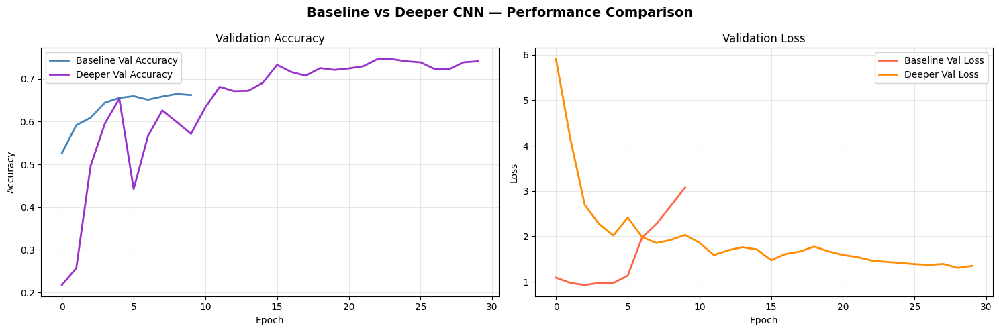

Saved: baseline_vs_deeper_comparison.png


In [42]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 25: Baseline vs Deeper — Side by Side           ║
# ╚══════════════════════════════════════════════════════════════╝

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Baseline vs Deeper CNN — Performance Comparison',
             fontsize=14, fontweight='bold')

# ── Validation Accuracy ───────────────────────────────────────
axes[0].plot(history_baseline.history['val_accuracy'],
             label='Baseline Val Accuracy', color='steelblue', linewidth=2)
axes[0].plot(history_deeper.history['val_accuracy'],
             label='Deeper Val Accuracy', color='darkorchid', linewidth=2)
axes[0].set_title('Validation Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# ── Validation Loss ───────────────────────────────────────────
axes[1].plot(history_baseline.history['val_loss'],
             label='Baseline Val Loss', color='tomato', linewidth=2)
axes[1].plot(history_deeper.history['val_loss'],
             label='Deeper Val Loss', color='darkorange', linewidth=2)
axes[1].set_title('Validation Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('baseline_vs_deeper_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: baseline_vs_deeper_comparison.png")

**Train Deeper Model with SGD**

In [43]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 26: Train Deeper CNN with SGD Optimizer         ║
# ╚══════════════════════════════════════════════════════════════╝

model_sgd = build_deeper_model()

model_sgd.compile(
    optimizer=tf.keras.optimizers.SGD(
        learning_rate=0.01,
        momentum=0.9,
        nesterov=True
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("Training Deeper CNN with SGD (momentum=0.9, nesterov=True)...\n")
start_sgd = time.time()

history_sgd = model_sgd.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=7,
                      restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=3, min_lr=1e-7, verbose=1)
    ],
    verbose=1
)

sgd_time = time.time() - start_sgd
val_loss_sgd, val_acc_sgd = model_sgd.evaluate(val_gen, verbose=0)
print(f"\nSGD — Val Accuracy: {val_acc_sgd*100:.2f}% | "
      f"Val Loss: {val_loss_sgd:.4f} | "
      f"Time: {sgd_time/60:.2f} min")

Training Deeper CNN with SGD (momentum=0.9, nesterov=True)...

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 39s 193ms/step - accuracy: 0.3858 - loss: 6.6110 - val_accuracy: 0.3227 - val_loss: 7.3630 - learning_rate: 0.0100
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - accuracy: 0.4712 - loss: 6.2940 - val_accuracy: 0.4849 - val_loss: 6.1165 - learning_rate: 0.0100
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - accuracy: 0.5120 - loss: 5.9428 - val_accuracy: 0.4975 - val_loss: 5.8446 - learning_rate: 0.0100
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - accuracy: 0.5414 - loss: 5.6139 - val_accuracy: 0.6101 - val_loss: 5.3510 - learning_rate: 0.0100
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - accuracy: 0.5613 - loss: 5.3170 - val_accuracy: 0.5891 - val_loss: 5.1400 - learning_rate: 0.0100
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - accuracy: 0.5824 - loss: 5.0341 - val_accuracy: 0.5815 - val_loss: 4.9965 - learning_rate: 0.0100
Epoch 7

**Train Deeper Model with Adam**

In [44]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 27: Train Deeper CNN with Adam Optimizer        ║
# ╚══════════════════════════════════════════════════════════════╝

model_adam = build_deeper_model()

model_adam.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=0.001
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("Training Deeper CNN with Adam...\n")
start_adam = time.time()

history_adam = model_adam.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=7,
                      restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=3, min_lr=1e-7, verbose=1)
    ],
    verbose=1
)

adam_time = time.time() - start_adam
val_loss_adam, val_acc_adam = model_adam.evaluate(val_gen, verbose=0)
print(f"\nAdam — Val Accuracy: {val_acc_adam*100:.2f}% | "
      f"Val Loss: {val_loss_adam:.4f} | "
      f"Time: {adam_time/60:.2f} min")

Training Deeper CNN with Adam...

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 42s 195ms/step - accuracy: 0.4392 - loss: 4.7753 - val_accuracy: 0.2252 - val_loss: 5.4569 - learning_rate: 0.0010
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - accuracy: 0.5022 - loss: 3.6726 - val_accuracy: 0.3378 - val_loss: 3.6426 - learning_rate: 0.0010
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - accuracy: 0.5347 - loss: 2.9596 - val_accuracy: 0.5345 - val_loss: 2.6698 - learning_rate: 0.0010
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - accuracy: 0.5525 - loss: 2.5337 - val_accuracy: 0.5420 - val_loss: 2.3783 - learning_rate: 0.0010
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - accuracy: 0.5673 - loss: 2.2559 - val_accuracy: 0.5807 - val_loss: 2.2521 - learning_rate: 0.0010
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 18s 122ms/step - accuracy: 0.5952 - loss: 2.0948 - val_accuracy: 0.4294 - val_loss: 2.5203 - learning_rate: 0.0010
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━

**SGD vs Adam Comparison Plot**

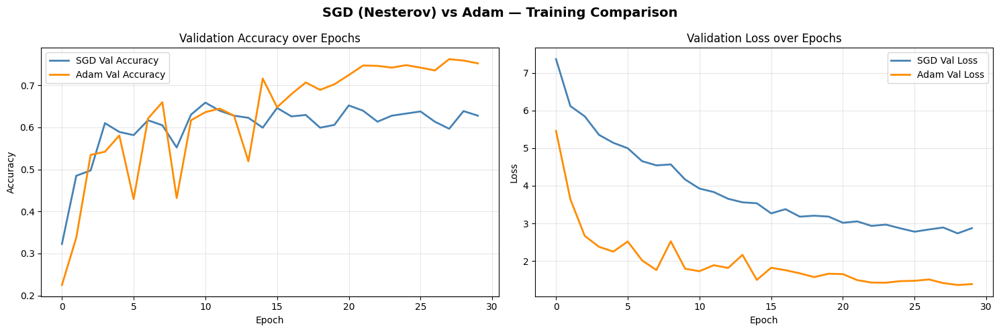

Saved: sgd_vs_adam_comparison.png


In [45]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 28: SGD vs Adam — Comparison Plot               ║
# ╚══════════════════════════════════════════════════════════════╝

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('SGD (Nesterov) vs Adam — Training Comparison',
             fontsize=14, fontweight='bold')

# ── Validation Accuracy ───────────────────────────────────────
axes[0].plot(history_sgd.history['val_accuracy'],
             label='SGD Val Accuracy', color='steelblue', linewidth=2)
axes[0].plot(history_adam.history['val_accuracy'],
             label='Adam Val Accuracy', color='darkorange', linewidth=2)
axes[0].set_title('Validation Accuracy over Epochs')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# ── Validation Loss ───────────────────────────────────────────
axes[1].plot(history_sgd.history['val_loss'],
             label='SGD Val Loss', color='steelblue', linewidth=2)
axes[1].plot(history_adam.history['val_loss'],
             label='Adam Val Loss', color='darkorange', linewidth=2)
axes[1].set_title('Validation Loss over Epochs')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('sgd_vs_adam_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: sgd_vs_adam_comparison.png")

**SGD vs Adam Classification Reports**

In [46]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 29: SGD vs Adam — Classification Reports        ║
# ╚══════════════════════════════════════════════════════════════╝

val_gen.reset()
y_pred_sgd = np.argmax(model_sgd.predict(val_gen, verbose=0), axis=1)

val_gen.reset()
y_pred_adam = np.argmax(model_adam.predict(val_gen, verbose=0), axis=1)

y_true = val_gen.classes

print("SGD — Classification Report:")
print("=" * 55)
print(classification_report(y_true, y_pred_sgd, target_names=class_names))

print("\nAdam — Classification Report:")
print("=" * 55)
print(classification_report(y_true, y_pred_adam, target_names=class_names))

SGD — Classification Report:
              precision    recall  f1-score   support

       daisy       0.74      0.67      0.71       238
   dandelion       0.69      0.65      0.67       238
        rose       0.53      0.58      0.56       238
   sunflower       0.65      0.74      0.69       238
       tulip       0.60      0.54      0.57       238

    accuracy                           0.64      1190
   macro avg       0.64      0.64      0.64      1190
weighted avg       0.64      0.64      0.64      1190


Adam — Classification Report:
              precision    recall  f1-score   support

       daisy       0.85      0.79      0.82       238
   dandelion       0.80      0.79      0.80       238
        rose       0.75      0.58      0.66       238
   sunflower       0.77      0.87      0.82       238
       tulip       0.64      0.76      0.69       238

    accuracy                           0.76      1190
   macro avg       0.76      0.76      0.76      1190
weighted avg     

**Ablation Study (Remove BatchNormalization)**

In [47]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 30: Ablation Study — Remove BatchNorm           ║
# ╚══════════════════════════════════════════════════════════════╝



def build_ablation_model():
    model = keras.Sequential([
        keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3)),

        # ── Conv Block 1: No BatchNorm ────────────────────────
        layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.AveragePooling2D((2, 2)),

        # ── Conv Block 2: No BatchNorm ────────────────────────
        layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.AveragePooling2D((2, 2)),

        # ── Conv Block 3: No BatchNorm ────────────────────────
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.001)),
        layers.AveragePooling2D((2, 2)),

        layers.Flatten(),

        # ── Dense: No BatchNorm (Dropout + L2 kept) ───────────
        layers.Dense(512, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
        layers.Dropout(0.5),

        layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(0.001)),
        layers.Dropout(0.3),

        layers.Dense(NUM_CLASSES, activation='softmax')

    ], name="Ablation_No_BatchNorm")

    return model

model_ablation = build_ablation_model()
model_ablation.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model_ablation.summary()

Model: "Ablation_No_BatchNorm"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_9             │ (None, 75, 75, 64)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_10            │ (None, 37, 37, 128)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_11            │ (None, 18, 18, 256)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 82944)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 512)            │    42,467,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,745,861 (166.88 MB)

 Trainable params: 43,745,861 (166.88 MB)

 Non-trainable params: 0 (0.00 B)

**Train Ablation Model**

In [48]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 31: Train Ablation Model                        ║
# ╚══════════════════════════════════════════════════════════════╝

print("Training Ablation Model (No BatchNorm)...\n")
start_ablation = time.time()

history_ablation = model_ablation.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=7,
                      restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=3, min_lr=1e-7, verbose=1)
    ],
    verbose=1
)

ablation_time = time.time() - start_ablation

val_loss_abl, val_acc_abl = model_ablation.evaluate(val_gen, verbose=0)

val_gen.reset()
y_pred_abl = np.argmax(model_ablation.predict(val_gen, verbose=0), axis=1)

print("=" * 55)
print("   ABLATION MODEL (No BatchNorm) — EVALUATION")
print("=" * 55)
print(classification_report(val_gen.classes, y_pred_abl, target_names=class_names))
print(f"  Validation Accuracy : {val_acc_abl * 100:.2f}%")
print(f"  Validation Loss     : {val_loss_abl:.4f}")
print(f"  Training Time       : {ablation_time / 60:.2f} min")

Training Ablation Model (No BatchNorm)...

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 35s 185ms/step - accuracy: 0.2025 - loss: 2.1009 - val_accuracy: 0.2000 - val_loss: 1.7877 - learning_rate: 0.0010
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - accuracy: 0.1931 - loss: 1.7372 - val_accuracy: 0.2000 - val_loss: 1.6994 - learning_rate: 0.0010
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - accuracy: 0.1990 - loss: 1.6785 - val_accuracy: 0.2000 - val_loss: 1.6607 - learning_rate: 0.0010
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - accuracy: 0.1910 - loss: 1.6500 - val_accuracy: 0.2000 - val_loss: 1.6402 - learning_rate: 0.0010
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - accuracy: 0.1983 - loss: 1.6340 - val_accuracy: 0.2000 - val_loss: 1.6283 - learning_rate: 0.0010
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - accuracy: 0.1912 - loss: 1.6249 - val_accuracy: 0.2000 - val_loss: 1.6214 - learning_rate: 0.0010
Epoch 7/30
150/150 ━━━━━━━━

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


**With BatchNorm vs Without BatchNorm Plot**

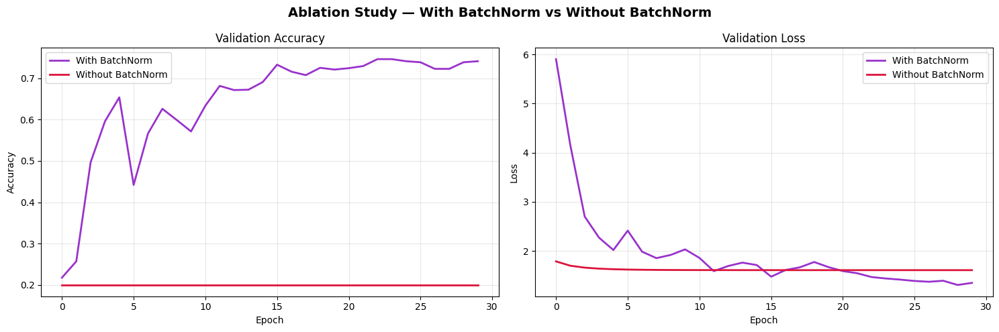

Saved: ablation_batchnorm_comparison.png


In [49]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 32: With BatchNorm vs Without BatchNorm         ║
# ╚══════════════════════════════════════════════════════════════╝

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Ablation Study — With BatchNorm vs Without BatchNorm',
             fontsize=14, fontweight='bold')

axes[0].plot(history_deeper.history['val_accuracy'],
             label='With BatchNorm', color='darkorchid', linewidth=2)
axes[0].plot(history_ablation.history['val_accuracy'],
             label='Without BatchNorm', color='crimson', linewidth=2)
axes[0].set_title('Validation Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(history_deeper.history['val_loss'],
             label='With BatchNorm', color='darkorchid', linewidth=2)
axes[1].plot(history_ablation.history['val_loss'],
             label='Without BatchNorm', color='crimson', linewidth=2)
axes[1].set_title('Validation Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('ablation_batchnorm_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: ablation_batchnorm_comparison.png")

**Training Time Comparison**

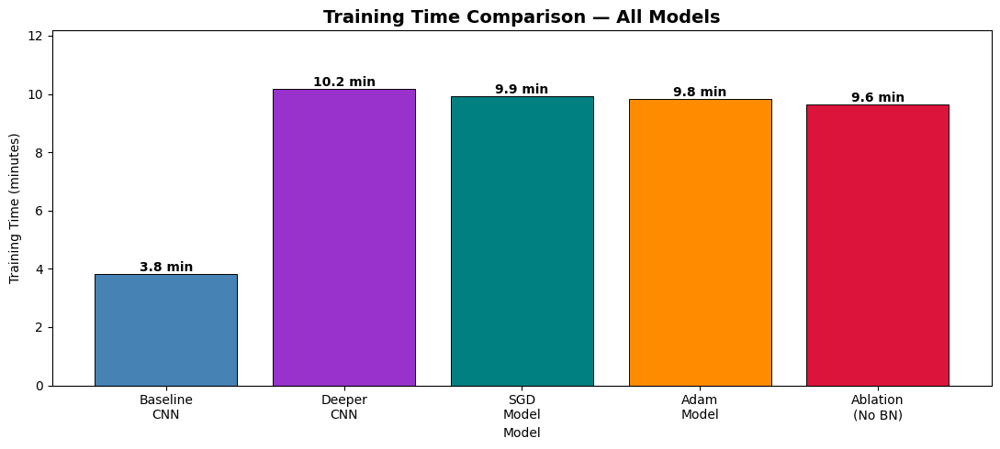

Saved: training_time_comparison.png


In [50]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 33: Training Time Comparison (Extra)            ║
# ╚══════════════════════════════════════════════════════════════╝

model_names = ['Baseline\nCNN', 'Deeper\nCNN', 'SGD\nModel',
               'Adam\nModel', 'Ablation\n(No BN)']
train_times = [baseline_time/60, deeper_time/60,
               sgd_time/60, adam_time/60, ablation_time/60]
bar_colors  = ['steelblue', 'darkorchid', 'teal',
               'darkorange', 'crimson']

plt.figure(figsize=(11, 5))
bars = plt.bar(model_names, train_times, color=bar_colors,
               edgecolor='black', linewidth=0.7)
plt.title('Training Time Comparison — All Models',
          fontsize=14, fontweight='bold')
plt.xlabel('Model')
plt.ylabel('Training Time (minutes)')
plt.ylim(0, max(train_times) + 2)
for bar, t in zip(bars, train_times):
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height() + 0.1,
             f"{t:.1f} min", ha='center',
             fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig('training_time_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: training_time_comparison.png")

**Create Transfer Learning Generators**

In [51]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 34: Transfer Learning Generators                ║
# ╚══════════════════════════════════════════════════════════════╝

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# ── ResNet50 needs its own preprocessing (not just /255) ─────
tl_train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,   # ResNet50 specific
    validation_split=0.2,
    rotation_range=30,
    width_shift_range=0.25,
    height_shift_range=0.25,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

tl_val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,   # ResNet50 specific
    validation_split=0.2
)

train_gen_tl = tl_train_datagen.flow_from_directory(
    augmented_train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    subset='training',
    seed=SEED,
    shuffle=True
)

val_gen_tl = tl_val_datagen.flow_from_directory(
    augmented_train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    subset='validation',
    seed=SEED,
    shuffle=False
)

print("Class indices     :", train_gen_tl.class_indices)
print(f"Training samples  : {train_gen_tl.samples}")
print(f"Validation samples: {val_gen_tl.samples}")

Found 4775 images belonging to 5 classes.
Found 1190 images belonging to 5 classes.
Class indices     : {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}
Training samples  : 4775
Validation samples: 1190


**Load ResNet50 & Build Transfer Model**

In [52]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 35: Load ResNet50 & Build Transfer Model        ║
# ╚══════════════════════════════════════════════════════════════╝

# ── Load ResNet50 base (no top layer) ────────────────────────
base_model = ResNet50(
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
    include_top=False,
    weights='imagenet'
)

# ── Freeze all base layers initially ─────────────────────────
base_model.trainable = False

print(f"ResNet50 total layers     : {len(base_model.layers)}")
print(f"Trainable variables now   : {len(base_model.trainable_variables)}")

# ── Build full model on top of ResNet50 ──────────────────────
inputs = keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)

# ── Custom classification head ────────────────────────────────
x = layers.Dense(512, activation='relu',
                 kernel_regularizer=regularizers.l2(0.001))(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.5)(x)

x = layers.Dense(256, activation='relu',
                 kernel_regularizer=regularizers.l2(0.001))(x)
x = layers.Dropout(0.3)(x)

outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

transfer_model = keras.Model(inputs, outputs, name='ResNet50_Transfer')

transfer_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

transfer_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step
ResNet50 total layers     : 175
Trainable variables now   : 0


Model: "ResNet50_Transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 5, 5, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,771,461 (94.50 MB)

 Trainable params: 1,182,725 (4.51 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

**Phase 1: Feature Extraction (Frozen Base)**

In [53]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 36: Phase 1 — Feature Extraction               ║
# ╚══════════════════════════════════════════════════════════════╝

print("Phase 1: Feature Extraction — Base frozen...\n")
start_phase1 = time.time()

history_phase1 = transfer_model.fit(
    train_gen_tl,
    validation_data=val_gen_tl,
    epochs=15,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=5,
                      restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=3, min_lr=1e-7, verbose=1)
    ],
    verbose=1
)

phase1_time = time.time() - start_phase1
val_loss_p1, val_acc_p1 = transfer_model.evaluate(val_gen_tl, verbose=0)

print(f"\nPhase 1 Complete!")
print(f"  Val Accuracy : {val_acc_p1 * 100:.2f}%")
print(f"  Val Loss     : {val_loss_p1:.4f}")
print(f"  Time         : {phase1_time / 60:.2f} min")

Phase 1: Feature Extraction — Base frozen...

Epoch 1/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 76s 400ms/step - accuracy: 0.7093 - loss: 1.9847 - val_accuracy: 0.8378 - val_loss: 1.6557 - learning_rate: 0.0010
Epoch 2/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 45s 302ms/step - accuracy: 0.7860 - loss: 1.6702 - val_accuracy: 0.8538 - val_loss: 1.4317 - learning_rate: 0.0010
Epoch 3/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 46s 306ms/step - accuracy: 0.8050 - loss: 1.4825 - val_accuracy: 0.8395 - val_loss: 1.3820 - learning_rate: 0.0010
Epoch 4/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 45s 301ms/step - accuracy: 0.8226 - loss: 1.3432 - val_accuracy: 0.8555 - val_loss: 1.2424 - learning_rate: 0.0010
Epoch 5/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 46s 306ms/step - accuracy: 0.8356 - loss: 1.2284 - val_accuracy: 0.8723 - val_loss: 1.0870 - learning_rate: 0.0010
Epoch 6/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 45s 302ms/step - accuracy: 0.8429 - loss: 1.1111 - val_accuracy: 0.8773 - val_loss: 1.0259 - learning_rate: 0.0010
Epoch 7/15
150/150 ━━━━━

**Phase 2: Fine-Tuning (Unfreeze Last 20 Layers)**

In [54]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 37: Phase 2 — Fine-Tuning ResNet50              ║
# ╚══════════════════════════════════════════════════════════════╝

# ── Unfreeze last 20 layers  ─────────
base_model.trainable = True

for layer in base_model.layers[:-20]:
    layer.trainable = False

trainable_now = sum(1 for l in base_model.layers if l.trainable)
print(f"Total base layers         : {len(base_model.layers)}")
print(f"Trainable layers now      : {trainable_now}")
print(f"Frozen layers             : {len(base_model.layers) - trainable_now}")

# ── Recompile with very low learning rate ────────────────────
transfer_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nPhase 2: Fine-Tuning — Last 20 layers unfrozen...\n")
start_phase2 = time.time()

history_phase2 = transfer_model.fit(
    train_gen_tl,
    validation_data=val_gen_tl,
    epochs=15,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=5,
                      restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=3, min_lr=1e-8, verbose=1)
    ],
    verbose=1
)

phase2_time = time.time() - start_phase2
total_tl_time = phase1_time + phase2_time

val_loss_tl, val_acc_tl = transfer_model.evaluate(val_gen_tl, verbose=0)
print(f"\nPhase 2 Complete!")
print(f"  Val Accuracy : {val_acc_tl * 100:.2f}%")
print(f"  Val Loss     : {val_loss_tl:.4f}")
print(f"  Time         : {phase2_time / 60:.2f} min")

Total base layers         : 175
Trainable layers now      : 20
Frozen layers             : 155

Phase 2: Fine-Tuning — Last 20 layers unfrozen...

Epoch 1/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 81s 410ms/step - accuracy: 0.8580 - loss: 0.7412 - val_accuracy: 0.8807 - val_loss: 0.7294 - learning_rate: 1.0000e-05
Epoch 2/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 46s 305ms/step - accuracy: 0.8806 - loss: 0.7008 - val_accuracy: 0.8891 - val_loss: 0.7186 - learning_rate: 1.0000e-05
Epoch 3/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 45s 301ms/step - accuracy: 0.8871 - loss: 0.6743 - val_accuracy: 0.8874 - val_loss: 0.7100 - learning_rate: 1.0000e-05
Epoch 4/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 46s 305ms/step - accuracy: 0.8961 - loss: 0.6473 - val_accuracy: 0.8916 - val_loss: 0.7034 - learning_rate: 1.0000e-05
Epoch 5/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 45s 302ms/step - accuracy: 0.8972 - loss: 0.6362 - val_accuracy: 0.8941 - val_loss: 0.6898 - learning_rate: 1.0000e-05
Epoch 6/15
150/150 ━━━━━━━━━━━━━━━━━━━━ 46s 304ms/step - a

**Transfer Learning Training Curves**

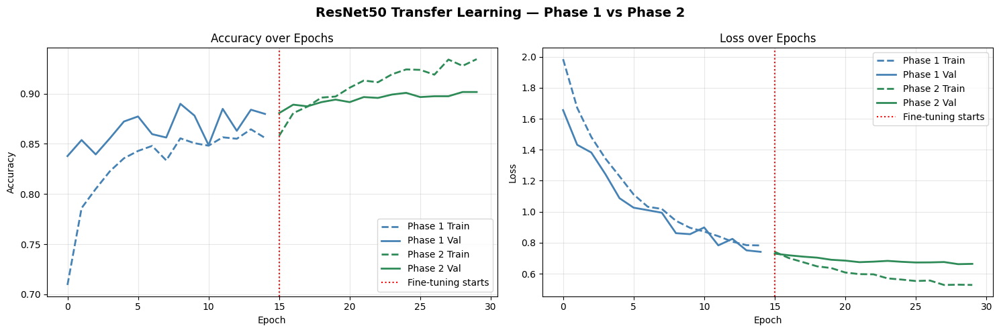

Saved: resnet50_transfer_learning_curves.png


In [55]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 38: Transfer Learning — Training Curves         ║
# ╚══════════════════════════════════════════════════════════════╝

p1_len = len(history_phase1.history['accuracy'])
p2_len = len(history_phase2.history['accuracy'])
p2_x   = range(p1_len, p1_len + p2_len)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('ResNet50 Transfer Learning — Phase 1 vs Phase 2',
             fontsize=14, fontweight='bold')

# ── Accuracy ─────────────────────────────────────────────────
axes[0].plot(history_phase1.history['accuracy'],
             label='Phase 1 Train', color='steelblue',
             linestyle='--', linewidth=2)
axes[0].plot(history_phase1.history['val_accuracy'],
             label='Phase 1 Val', color='steelblue', linewidth=2)
axes[0].plot(p2_x, history_phase2.history['accuracy'],
             label='Phase 2 Train', color='seagreen',
             linestyle='--', linewidth=2)
axes[0].plot(p2_x, history_phase2.history['val_accuracy'],
             label='Phase 2 Val', color='seagreen', linewidth=2)
axes[0].axvline(x=p1_len, color='red', linestyle=':',
                linewidth=1.5, label='Fine-tuning starts')
axes[0].set_title('Accuracy over Epochs')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# ── Loss ─────────────────────────────────────────────────────
axes[1].plot(history_phase1.history['loss'],
             label='Phase 1 Train', color='steelblue',
             linestyle='--', linewidth=2)
axes[1].plot(history_phase1.history['val_loss'],
             label='Phase 1 Val', color='steelblue', linewidth=2)
axes[1].plot(p2_x, history_phase2.history['loss'],
             label='Phase 2 Train', color='seagreen',
             linestyle='--', linewidth=2)
axes[1].plot(p2_x, history_phase2.history['val_loss'],
             label='Phase 2 Val', color='seagreen', linewidth=2)
axes[1].axvline(x=p1_len, color='red', linestyle=':',
                linewidth=1.5, label='Fine-tuning starts')
axes[1].set_title('Loss over Epochs')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('resnet50_transfer_learning_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: resnet50_transfer_learning_curves.png")

**Evaluate Transfer Model**

In [56]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 39: Evaluate Transfer Learning Model            ║
# ╚══════════════════════════════════════════════════════════════╝

val_gen_tl.reset()
y_pred_tl = np.argmax(transfer_model.predict(val_gen_tl, verbose=0), axis=1)
y_true_tl = val_gen_tl.classes

print("=" * 55)
print("    RESNET50 TRANSFER LEARNING — EVALUATION")
print("=" * 55)
print(classification_report(y_true_tl, y_pred_tl, target_names=class_names))
print(f"  Validation Accuracy : {val_acc_tl * 100:.2f}%")
print(f"  Validation Loss     : {val_loss_tl:.4f}")
print(f"  Phase 1 Time        : {phase1_time / 60:.2f} min")
print(f"  Phase 2 Time        : {phase2_time / 60:.2f} min")
print(f"  Total TL Time       : {total_tl_time / 60:.2f} min")
print("=" * 55)

    RESNET50 TRANSFER LEARNING — EVALUATION
              precision    recall  f1-score   support

       daisy       0.92      0.94      0.93       238
   dandelion       0.91      0.89      0.90       238
        rose       0.95      0.80      0.87       238
   sunflower       0.93      0.95      0.94       238
       tulip       0.82      0.93      0.87       238

    accuracy                           0.90      1190
   macro avg       0.91      0.90      0.90      1190
weighted avg       0.91      0.90      0.90      1190

  Validation Accuracy : 90.17%
  Validation Loss     : 0.6614
  Phase 1 Time        : 11.96 min
  Phase 2 Time        : 11.98 min
  Total TL Time       : 23.94 min


**Confusion Matrix Transfer Model**

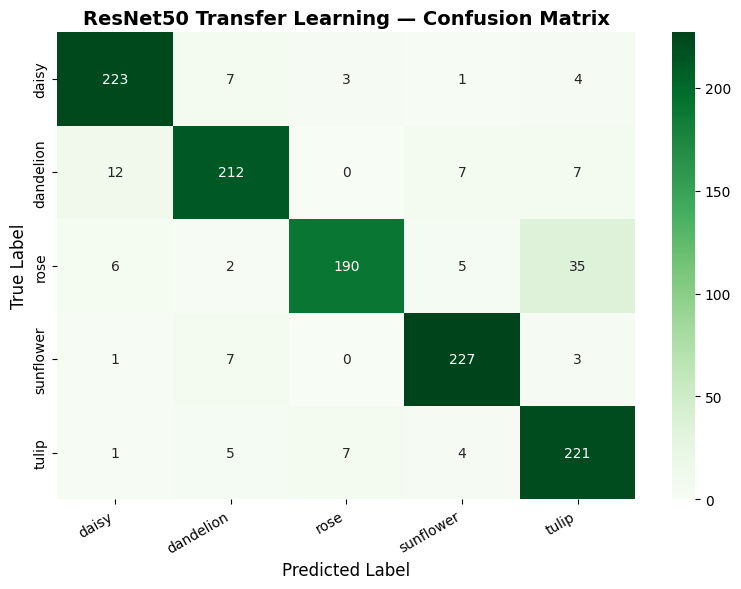

Saved: transfer_learning_confusion_matrix.png


In [57]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 40: Transfer Learning — Confusion Matrix        ║
# ╚══════════════════════════════════════════════════════════════╝

cm_tl = confusion_matrix(y_true_tl, y_pred_tl)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_tl, annot=True, fmt='d', cmap='Greens',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('ResNet50 Transfer Learning — Confusion Matrix',
          fontsize=14, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.savefig('transfer_learning_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: transfer_learning_confusion_matrix.png")

**Sample Predictions Transfer Model**

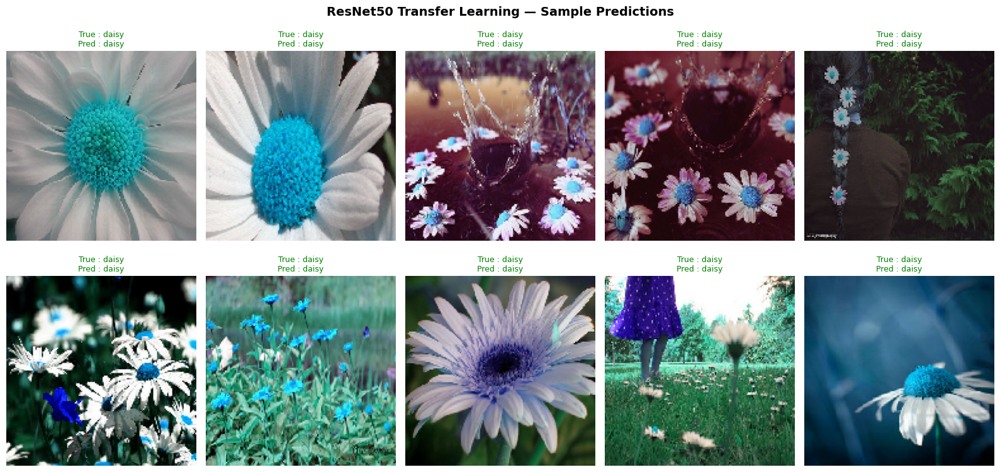

Saved: transfer_learning_predictions.png


In [58]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 41: Transfer Learning — Sample Predictions      ║
# ╚══════════════════════════════════════════════════════════════╝

val_gen_tl.reset()
images_tl, labels_tl = next(val_gen_tl)

fig, axes = plt.subplots(2, 5, figsize=(16, 8))
fig.suptitle('ResNet50 Transfer Learning — Sample Predictions',
             fontsize=14, fontweight='bold')

for i, ax in enumerate(axes.flat):
    img  = images_tl[i]
    true = class_names[int(labels_tl[i])]
    pred = class_names[np.argmax(
               transfer_model.predict(img[np.newaxis, ...], verbose=0))]
    color = 'green' if true == pred else 'red'

    # Reverse ResNet50 preprocessing for display
    display_img = img.copy()
    display_img += [103.939, 116.779, 123.68]
    display_img = np.clip(display_img / 255.0, 0, 1)

    ax.imshow(display_img)
    ax.set_title(f"True : {true}\nPred : {pred}",
                 color=color, fontsize=9, pad=5)
    ax.axis('off')

plt.tight_layout()
plt.savefig('transfer_learning_predictions.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: transfer_learning_predictions.png")

**Final Comparison: All Models**

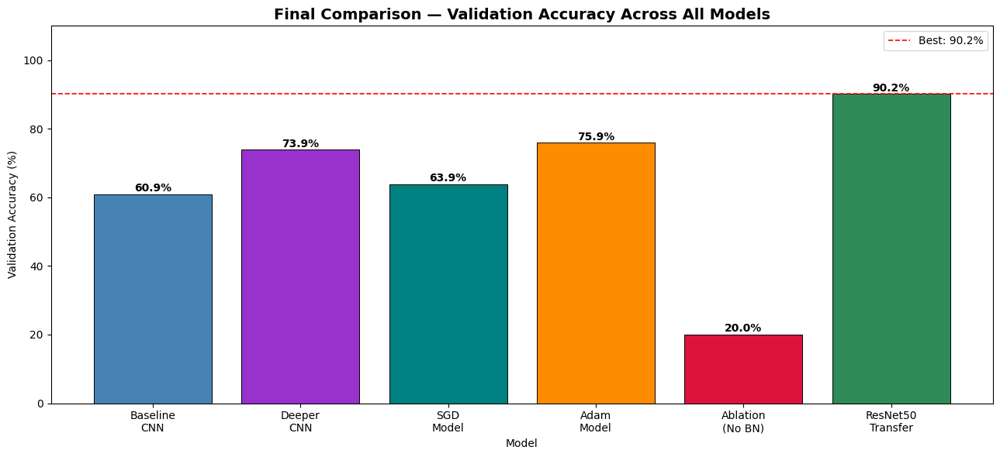

Saved: final_all_models_comparison.png


In [59]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 42: Final Comparison — All Models (Extra)       ║
# ╚══════════════════════════════════════════════════════════════╝

model_labels = ['Baseline\nCNN', 'Deeper\nCNN',
                'SGD\nModel', 'Adam\nModel',
                'Ablation\n(No BN)', 'ResNet50\nTransfer']

accuracies = [val_acc_b  * 100,
              val_acc_d  * 100,
              val_acc_sgd * 100,
              val_acc_adam * 100,
              val_acc_abl * 100,
              val_acc_tl  * 100]

bar_colors = ['steelblue', 'darkorchid', 'teal',
              'darkorange', 'crimson', 'seagreen']

plt.figure(figsize=(13, 6))
bars = plt.bar(model_labels, accuracies, color=bar_colors,
               edgecolor='black', linewidth=0.7)
plt.title('Final Comparison — Validation Accuracy Across All Models',
          fontsize=14, fontweight='bold')
plt.xlabel('Model')
plt.ylabel('Validation Accuracy (%)')
plt.ylim(0, 110)

for bar, acc in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height() + 0.8,
             f"{acc:.1f}%", ha='center',
             fontsize=10, fontweight='bold')

plt.axhline(y=max(accuracies), color='red', linestyle='--',
            linewidth=1.2, label=f'Best: {max(accuracies):.1f}%')
plt.legend()
plt.tight_layout()
plt.savefig('final_all_models_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: final_all_models_comparison.png")

**Hardware & Training Summary**

In [60]:
# ╔══════════════════════════════════════════════════════════════╗
# ║         Cell 43: Hardware & Training Summary                 ║
# ╚══════════════════════════════════════════════════════════════╝

print("=" * 60)
print("         HARDWARE & TRAINING SUMMARY")
print("=" * 60)
print(f"  Platform         : Google Colab")
print(f"  GPU Available    : {tf.config.list_physical_devices('GPU')}")
print(f"  TPU Available    : {tf.config.list_physical_devices('TPU')}")
print("=" * 60)
print(f"  Baseline CNN     : {baseline_time/60:.2f} min")
print(f"  Deeper CNN       : {deeper_time/60:.2f} min")
print(f"  SGD Model        : {sgd_time/60:.2f} min")
print(f"  Adam Model       : {adam_time/60:.2f} min")
print(f"  Ablation Model   : {ablation_time/60:.2f} min")
print(f"  Transfer (P1+P2) : {total_tl_time/60:.2f} min")
print("-" * 60)
total_all = (baseline_time + deeper_time + sgd_time +
             adam_time + ablation_time + total_tl_time)
print(f"  TOTAL TRAIN TIME : {total_all/60:.2f} min")
print("=" * 60)

         HARDWARE & TRAINING SUMMARY
  Platform         : Google Colab
  GPU Available    : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
  TPU Available    : []
  Baseline CNN     : 3.82 min
  Deeper CNN       : 10.18 min
  SGD Model        : 9.92 min
  Adam Model       : 9.82 min
  Ablation Model   : 9.65 min
  Transfer (P1+P2) : 23.94 min
------------------------------------------------------------
  TOTAL TRAIN TIME : 67.32 min
